# Miniature microscopy

See section 2.3 in the paper for full results.

The data we use in this notebook was taken with the [UCLA Miniscope](http://miniscope.org/index.php/Main_Page).

The full resolution images require a fair bit of memory and can be a bit slow

## Setup

Here we import some necessary packages/helper functions

In [5]:
%load_ext autoreload
%autoreload 2
!export CUDA_VISIBLE_DEVICES=0,1,2,3 # REPLACE this line according to your GPUs

import os
os.environ["CUDA_VISIBLE_DEVICES"]="0,1,2,3" # REPLACE this line according to your GPUs

import sys
sys.path.append("..") # since the package is one level above. Normally you should keep them on the same!
import rdmpy

# here are some basics we will need for the demo
import torch
import numpy as np
import matplotlib.pyplot as plt

from skimage import io
from skimage.transform import resize
from PIL import Image

# REPLACE this in according to your computer, we highly recommend using a GPU.
# We needed ~20GB of GPU memory to run at full resolution (1024 x 1024).
if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')
    
    
print('Using ' +str(device) + ' for computation')

def center_crop(img, des_shape, center=None):
    if center is None:
        center = (img.shape[0] // 2, img.shape[1] // 2)
    left, right, up, down = (
        center[1] - des_shape[1] // 2,
        center[1] + int(np.round(des_shape[1] / 2)),
        center[0] - des_shape[0] // 2,
        center[0] + int(np.round(des_shape[0] / 2)),
    )
    img = img[up:down, left:right]
    return img

def crop(img, c):
    return img[c:-c,c:-c]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Using cuda:0 for computation


## One-time Calibration

We calibrate with randomly scattered 1 micron fluorescent beads.

In [6]:
dim = 1100 # Pick this according to how big of an image you want to deblur. Reduce if memory errors.
center = (967, 1160) # manually calibrated
CROP=38

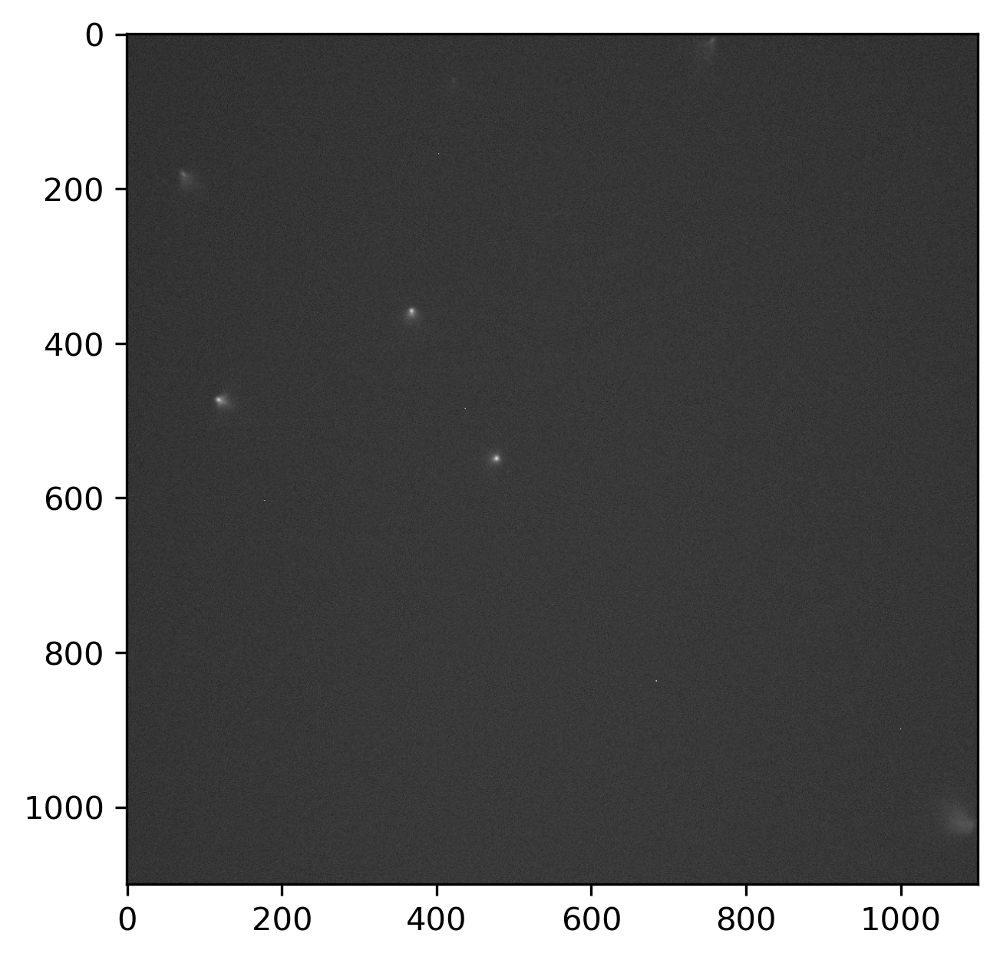

In [7]:
calibration_image = np.array(Image.open('rdm_data/miniscope/calibration/1.tif')) -  np.array(Image.open('rdm_data/miniscope/calibration/background.tif'))
plt.imshow(center_crop(calibration_image**(1/2), [dim,dim]), cmap='gray')
plt.show()

This next cell will take a bit of time and consume some memory, especially at the full resolution

[ 971 1223]
fitting seidel coefficients...


100%|██████████| 500/500 [00:20<00:00, 23.83it/s]


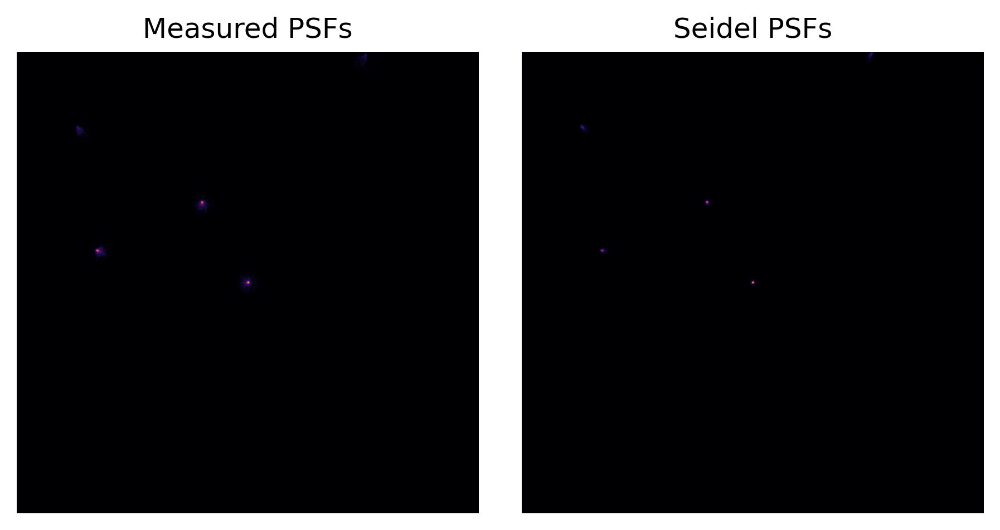

Fitted seidel coefficients: tensor([[0.7001],
        [0.4068],
        [0.7886],
        [0.3058],
        [0.0000],
        [0.0000]])
rendering PSFs...


100%|██████████| 1100/1100 [07:06<00:00,  2.58it/s]


In [8]:
fit_params = {"centered_psf": True, "iters": 500, "num_seidel": 4, "lr": 1e-2}
seidel_coeffs, psf_data = rdmpy.calibrate_rdm(calibration_image, dim=dim, fit_params=fit_params, device=device, show_psfs=True)

## Restarget composite
For our first sample, we will deblur a composited resolution target, where we placed the highest resolution crop of the target in a 3x3 grid in the field-of-view and composited into a single image. The compositing code is included in the next cell.


In [9]:
def make_frankenimage(data_path, center, dim):
    back = np.load(data_path + "background-dim.npy")

    test_path = data_path + "x-40_y-40/"
    test_image_middle_middle = process(np.load(test_path + "1.npy"), back, dim, center)

    test_image_upper_left = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x-40_y0"
    test_path = data_path + test_name + "/"
    test_image_side_left = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x-40_y40"
    test_path = data_path + test_name + "/"
    test_image_lower_left = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x0_y40"
    test_path = data_path + test_name + "/"
    test_image_lower_middle = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x40_y40"
    test_path = data_path + test_name + "/"
    test_image_lower_right = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x40_y0"
    test_path = data_path + test_name + "/"
    test_image_side_right = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x40_y-40"
    test_path = data_path + test_name + "/"
    test_image_upper_right = process(np.load(test_path + "4.npy"), back, dim, center)

    test_name = "x0_y-40"
    test_path = data_path + test_name + "/"
    test_image_upper_middle = process(np.load(test_path + "4.npy"), back, dim, center)

    thd = int(np.floor(dim[0] / 3.0))

    franken_image = test_image_middle_middle
    franken_image[0:thd, 0:thd] = test_image_upper_left[0:thd, 0:thd]
    franken_image[thd : 2 * thd, 0:thd] = test_image_side_left[thd : 2 * thd, 0:thd]
    franken_image[2 * thd :, 0:thd] = test_image_lower_left[2 * thd :, 0:thd]
    franken_image[2 * thd :, thd : 2 * thd] = test_image_lower_middle[
        2 * thd :, thd : 2 * thd
    ]
    franken_image[2 * thd :, 2 * thd :] = test_image_lower_right[2 * thd :, 2 * thd :]
    franken_image[thd : 2 * thd, 2 * thd :] = test_image_side_right[
        thd : 2 * thd, 2 * thd :
    ]
    franken_image[0:thd, 2 * thd :] = test_image_upper_right[0:thd, 2 * thd :]
    franken_image[0:thd, thd : 2 * thd] = test_image_upper_middle[0:thd, thd : 2 * thd]

    return franken_image

def process(
    img,
    back,
    dim,
    center=None,
    tolerance=1,
    remove_outer=True,
):
    
    if center is None:
        center = (dim[0] // 2, dim[1] // 2)

    if back is not None:
        img = (img - back)
        img = img/img.max()

    img[img < 0] = 0
    img = img[
        center[0] - dim[0] // 2 : center[0] + dim[0] // 2,
        center[1] - dim[1] // 2 : center[1] + dim[1] // 2,
    ]

    if remove_outer:
        img = outer_ring(img)

    return img

def outer_ring(image):
    image[0, :] = 0
    image[-1, :] = 0
    image[:, 0] = 0
    image[:, -1] = 0

    return image

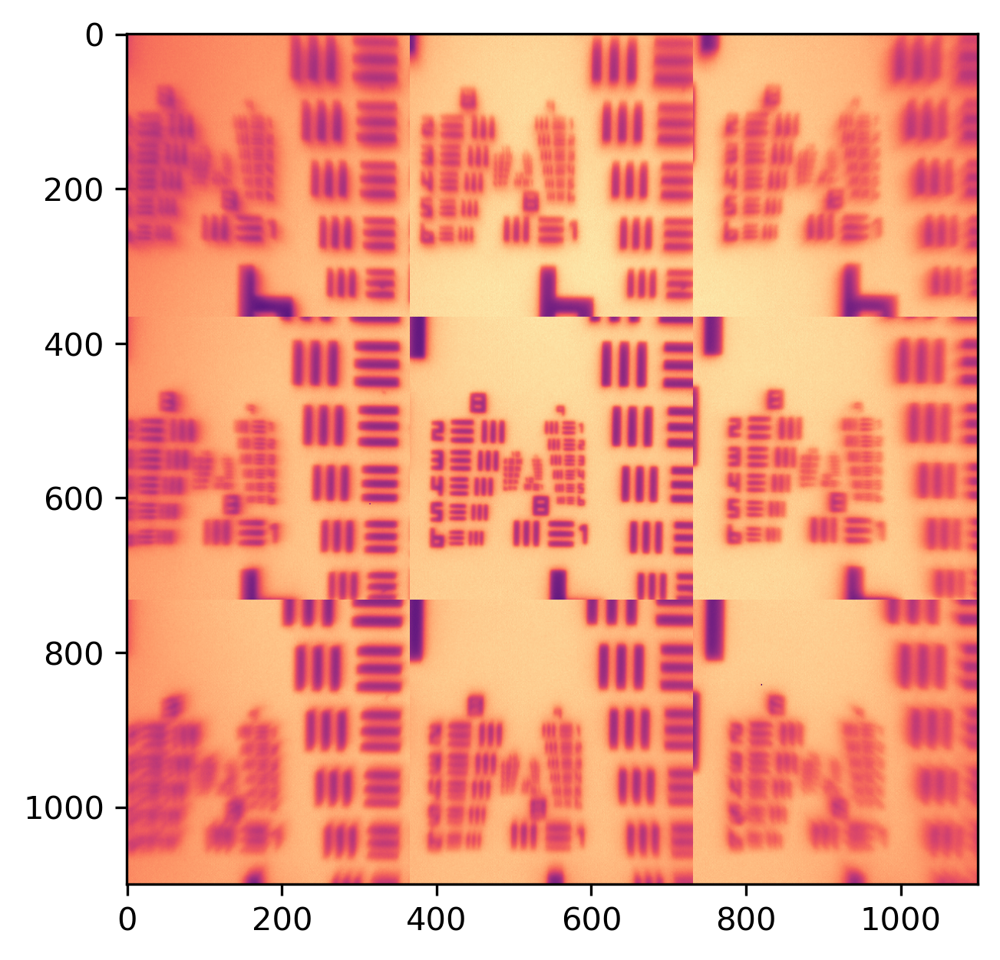

In [10]:
restarget = make_frankenimage('rdm_data/miniscope/restarget/testdiag_2021_06_06_', center=center, dim=(dim,dim))
plt.imshow(restarget, cmap='magma')
plt.show()

100%|██████████| 200/200 [06:08<00:00,  1.84s/it]


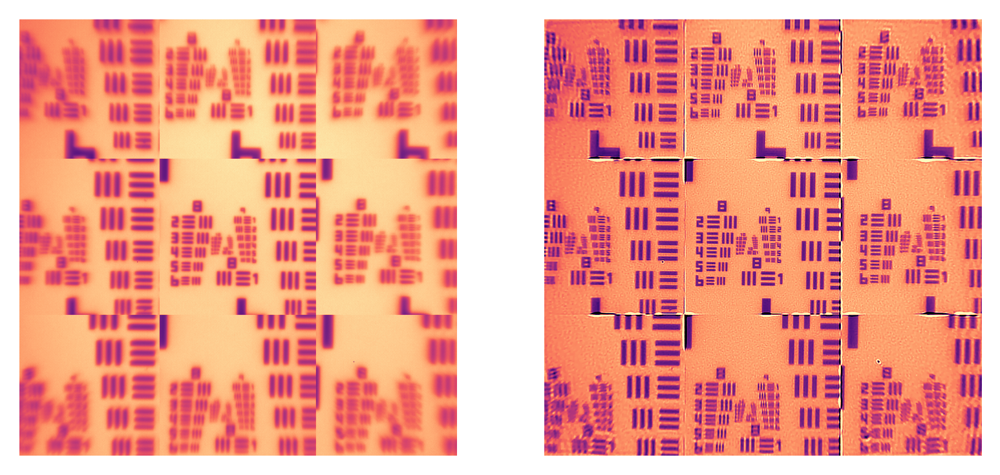

In [11]:
c = 62
restarget_rd = rdmpy.ring_deconvolve(
    restarget,
    psf_data,
    process=True,
    opt_params={
        "lr": 5e-2,
        "iters": 200,
        "tv_reg": 1e-10,
        "l2_reg": 1e-9,
        "l1_reg": 0,
        "process": False,
        "upper_projection" : True, # allows the optimzation to preserve contrast despite hot pixels.
    },
    device=device,
)


# plot raw and ring deconvolved beads
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(crop(restarget,CROP), cmap='magma')
ax1.axis('off')
ax2.imshow(crop(restarget_rd,CROP), cmap='magma')
ax2.axis('off') 
plt.show()

We can also try DeepRD to speed things up

loading model...


/home/amit/projects/rdmpy/experiments/../rdmpy/_src/util.py:746: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_type.load_state_dict(torch.load(model_path, map_location

rendering PSFs...


100%|██████████| 1/1 [00:00<00:00, 25.13it/s]


deblurring...


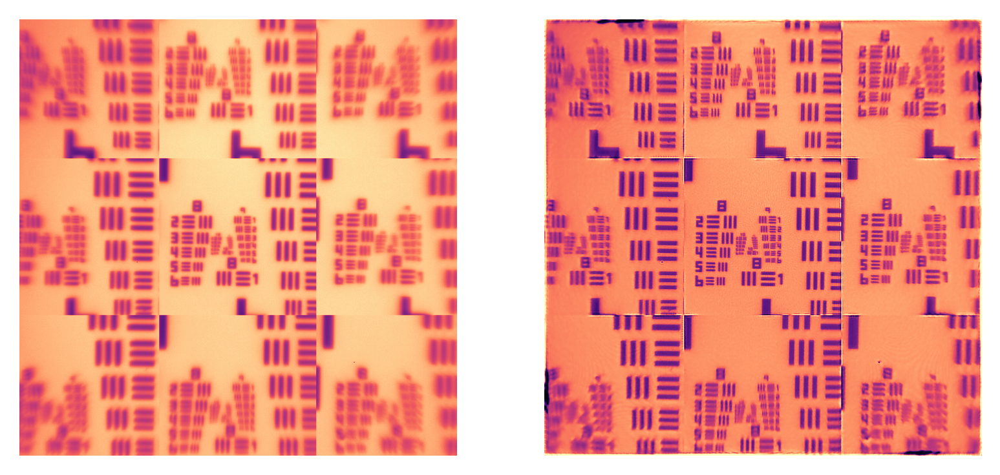

In [12]:
restarget_drd = rdmpy.deeprd(restarget[CROP:-CROP,CROP:-CROP], seidel_coeffs, device=device)

fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(crop(restarget[CROP:-CROP,CROP:-CROP],2), cmap='magma')
ax1.axis('off')
ax2.imshow(crop(restarget_drd,2), cmap='magma')
ax2.axis('off') 
plt.show()

## Deblurring waterbears
Now we can apply the exact same methodology to images of waterbears. We don't need to recalibrate!!

100%|██████████| 200/200 [05:15<00:00,  1.58s/it]


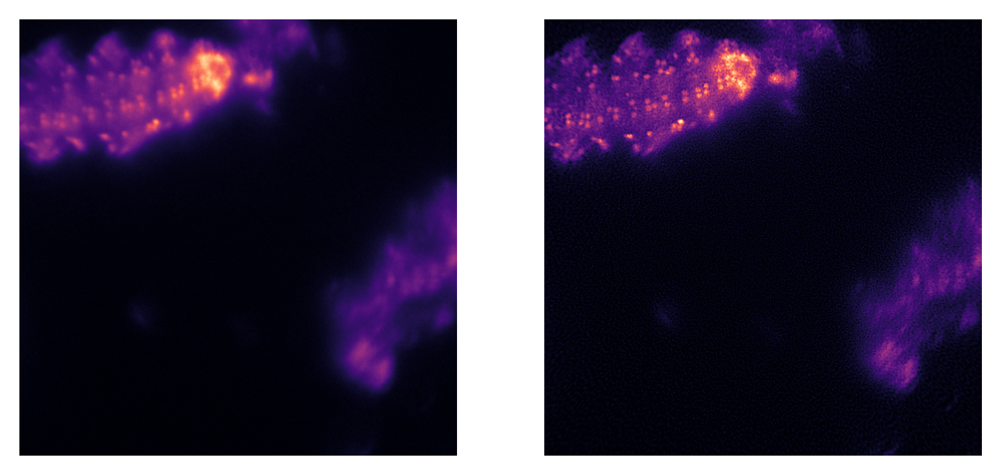

In [13]:
# read in a waterbear
wb1 = center_crop(np.load('rdm_data/miniscope/waterbear/12.npy') - np.load('rdm_data/miniscope/waterbear/background.npy'), (dim,dim), center=center)
wb1_rd = rdmpy.ring_deconvolve(
    wb1,
    psf_data,
    process= True,
    hot_pixel=True, # rdmpy also features a hot pixel remover!
    opt_params={
        "lr": 5e-2,
        "iters": 200,
        "tv_reg": 6e-11,
        "l2_reg": 1e-6,
        "l1_reg": 0,
        "upper_projection": True
    },
    device=device,
)

# plot raw and ring deconvolved beads
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(crop(rdmpy._src.util.process(wb1, wb1.shape, hot_pix=True),CROP), cmap='magma')
ax1.axis('off')
ax2.imshow(crop(wb1_rd,CROP), cmap='magma')
ax2.axis('off') 
plt.show()

Once again for less memory useage and compute time, we can employ DeepRD.

loading model...
rendering PSFs...


100%|██████████| 1/1 [00:00<00:00, 29.48it/s]

deblurring...


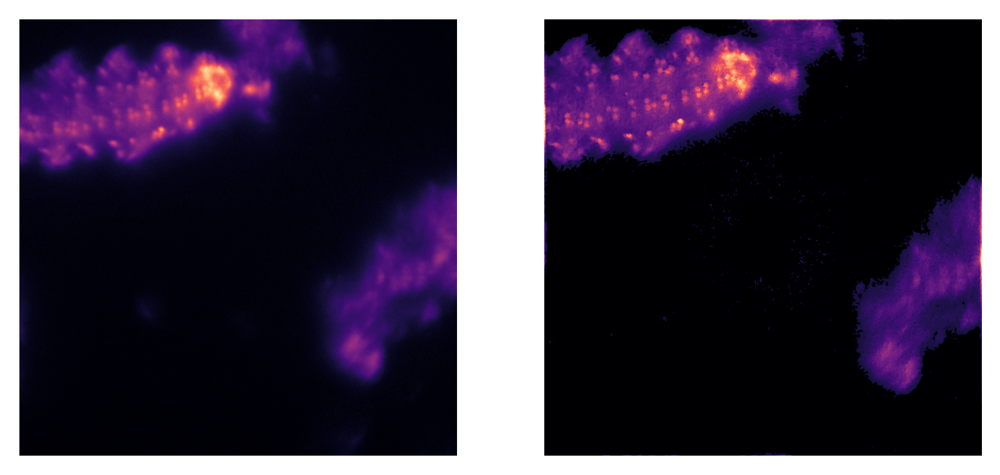

In [14]:
wb1_drd = rdmpy.deeprd(wb1[CROP:-CROP,CROP:-CROP], seidel_coeffs, device=device, process=True, hot_pixel=True, noisy=0.75)

fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(crop(rdmpy._src.util.process(wb1, wb1.shape, hot_pix=True),2), cmap='magma')
ax1.axis('off')
ax2.imshow(crop(wb1_drd,2), cmap='magma')
ax2.axis('off') 
plt.show()

Finally we can repeat this for rabbit liver tissue

100%|██████████| 200/200 [05:40<00:00,  1.70s/it]


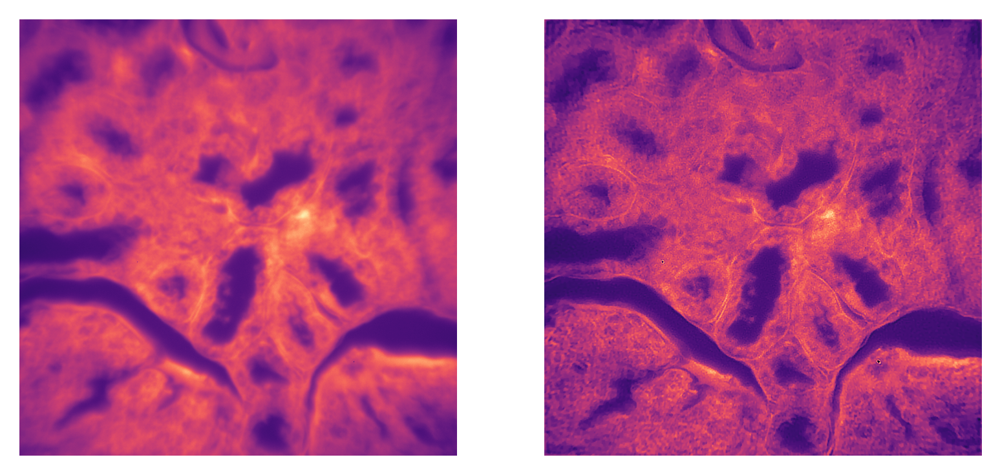

In [15]:
# read in a sample
rl1 = center_crop(np.load('rdm_data/miniscope/rabbitliver/1.npy') - np.load('rdm_data/miniscope/rabbitliver/background.npy'), (dim,dim), center=center)
rl1_rd = rdmpy.ring_deconvolve(
    rl1,
    psf_data,
    process=True,
    opt_params={
        "lr": 5e-2,
        "iters": 200,
        "tv_reg": 1e-10,
        "l2_reg": 1e-9,
        "l1_reg": 0,
        "upper_projection": True,
    },
    device=device,
)


# plot raw and ring deconvolved beads
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(crop(rl1,CROP), cmap='magma')
ax1.axis('off')
ax2.imshow(crop(rl1_rd,CROP), cmap='magma')
ax2.axis('off') 
plt.show()

Once again, we can use DeepRD

loading model...
rendering PSFs...


100%|██████████| 1/1 [00:00<00:00, 68.40it/s]

deblurring...


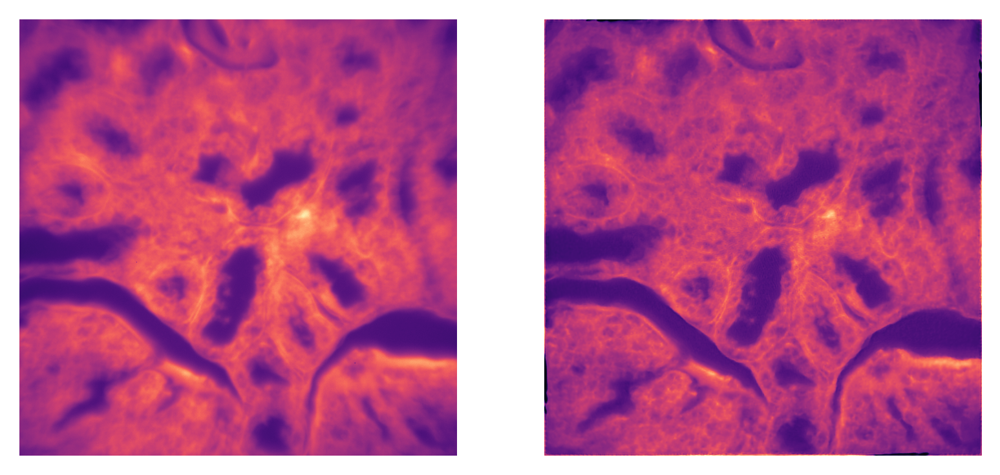

In [16]:
rl1_drd = rdmpy.deeprd(rl1[CROP:-CROP,CROP:-CROP], seidel_coeffs, device=device, process=True, hot_pixel=True)

fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(crop(rl1[CROP:-CROP,CROP:-CROP],5), cmap='magma')
ax1.axis('off')
ax2.imshow(crop(rl1_drd,5), cmap='magma')
ax2.axis('off') 
plt.show()